<a href="https://colab.research.google.com/github/Geoffrey-Chege/MORINGA_CORE_IPW7_GEOFFREY_CHEGE/blob/main/MORINGA_CORE_IPW7_GEOFFREY_CHEGE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# A python project: The factors that affect housing prices on real estate properties

## 1 Introduction

### Defining the Question

* Hass Consulting Company requires me to **study the factors** that affect housing prices real estate properties and to **create a model** that would allow the company to accurately predict the sale of prices upon being provided with the predictor variables. 

### Metrics for Success



* The metric of success is if we can show the influence of the different factors on the housing prices and create a model that can predict the prices given predictor variables.

### The context

* Hass Consulting Company which is a real estate leader will have an increased advantage in the sector by being able to highlight which factors affect housing prices and how they individually affect the prices. Additionally, a model that predicts the prices will be invaluable in helping the company perform better portfolio management.

### Experimental Design taken

- Data Reading & Cleaning
- Performing EDA
- Performing necessary feature engineering
- Performing regression analysis with the following models:
    - Multiple Linear Regression
    - Quantile Regression
    - Ridge Regression
    - Lasso Regression
    - Elastic Net Regression
- Incorporating categorical independent variables into the models.
- Checking for multicollinearity
- Providing a recommendation based on my analysis:
  * Creating residual plots for my models, and assessing heteroskedasticity using Barlett's test.
- Challenging my solution by providing insights on how to make improvements in the model.

### Appropriateness of the available Data

The data available is informaton on different housing units.

The link to the dataset: 
- http://bit.ly/IndependentProjectWeek7Dataset

## 2 Importing python Libraries to be used in Analysis

In [36]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [37]:
!pip install pydataset
from pydataset import data

In [113]:
# Importing python libraries used in analysis

import pandas as pd
import numpy as np
import scipy as sp
import pandas_profiling as pp
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
import statsmodels.formula.api as smf
from statsmodels.regression.quantile_regression import QuantReg
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, recall_score, precision_score
from sklearn.metrics import mean_squared_error,  r2_score 
from sklearn.model_selection import KFold, LeaveOneOut
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics

import warnings
warnings.filterwarnings('ignore')

## 3 Previewing the Datasets

In [39]:
# Creating and reading data frames

house = pd.read_csv('Independent Project Week 7 - house_data.csv')

In [40]:
# Previewing the top of the data frame

house.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [41]:
#check number of records

house.shape

(21613, 20)

## 4 Data Cleaning

### Missing Values

In [42]:
#checking column types
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   price          21613 non-null  float64
 2   bedrooms       21613 non-null  int64  
 3   bathrooms      21613 non-null  float64
 4   sqft_living    21613 non-null  int64  
 5   sqft_lot       21613 non-null  int64  
 6   floors         21613 non-null  float64
 7   waterfront     21613 non-null  int64  
 8   view           21613 non-null  int64  
 9   condition      21613 non-null  int64  
 10  grade          21613 non-null  int64  
 11  sqft_above     21613 non-null  int64  
 12  sqft_basement  21613 non-null  int64  
 13  yr_built       21613 non-null  int64  
 14  yr_renovated   21613 non-null  int64  
 15  zipcode        21613 non-null  int64  
 16  lat            21613 non-null  float64
 17  long           21613 non-null  float64
 18  sqft_l

In [43]:
#checking for nulls
house.isnull().sum()

id               0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

- From the above we can observe that our dataset is clean, it contains no nulls.

### Checking column names

In [44]:
# Checking names of the house data frame

house.columns

Index(['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

### Dropping unnecessary columns

In [45]:
#dropping unwanted columns id, lat,long

house.drop(['id','lat','long'], axis=1, inplace=True)

### Checking for anomalies

In [46]:
# Checking the number of unique values in each column of the house data frame

for column in house.columns:
  print(column)
  print(house[column].nunique())
  print('***********************')

price
3625
***********************
bedrooms
13
***********************
bathrooms
30
***********************
sqft_living
1038
***********************
sqft_lot
9782
***********************
floors
6
***********************
waterfront
2
***********************
view
5
***********************
condition
5
***********************
grade
12
***********************
sqft_above
946
***********************
sqft_basement
306
***********************
yr_built
116
***********************
yr_renovated
70
***********************
zipcode
70
***********************
sqft_living15
777
***********************
sqft_lot15
8689
***********************


### Checking for outliers

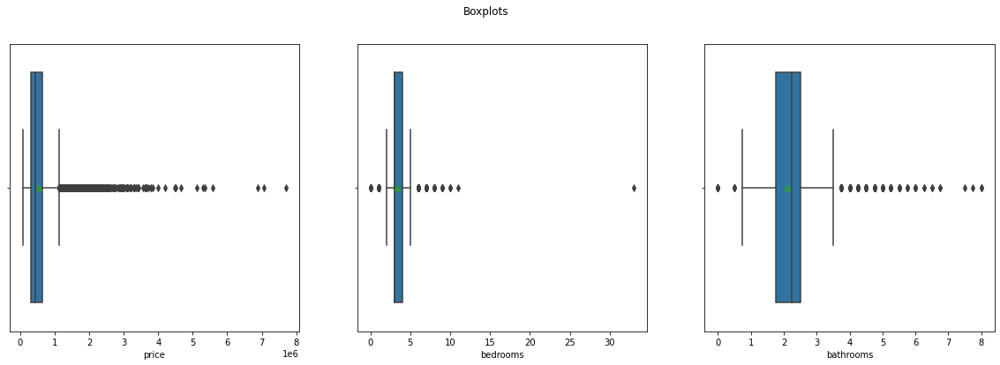

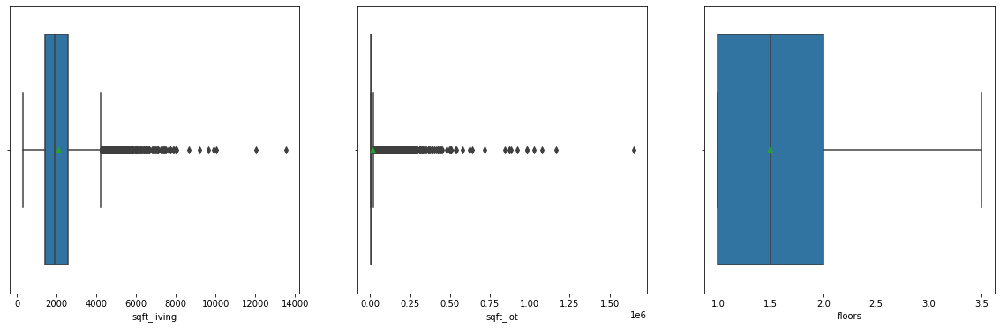

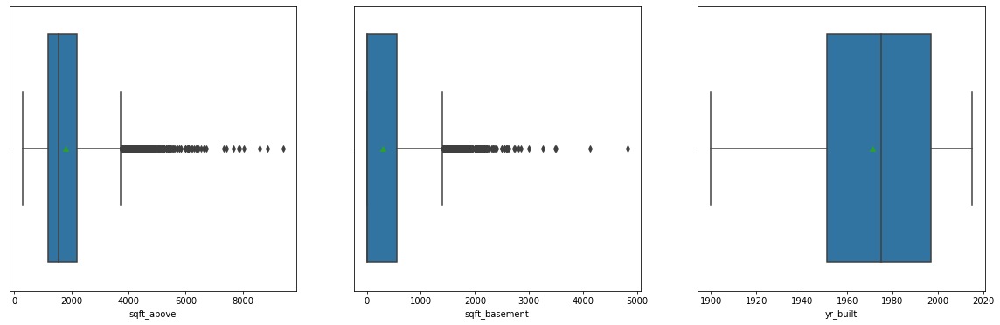

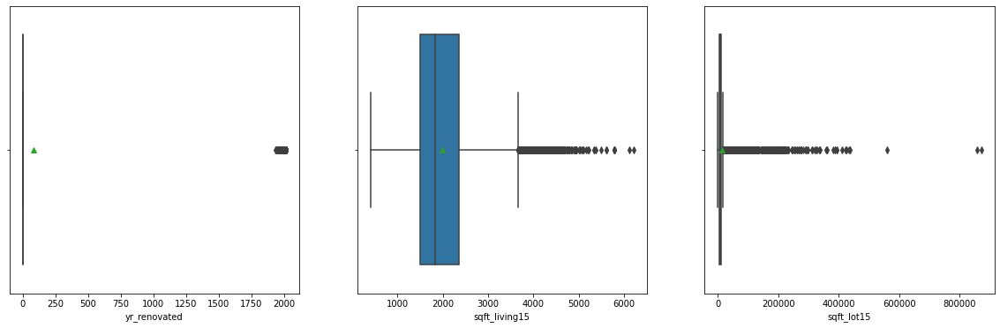

In [47]:
#checking for Outliers and Anomalies in the numerical columns
fig, (ax1, ax2,ax3) = plt.subplots(1,3, figsize=(20, 6))
fig.suptitle('Boxplots')
sns.boxplot(x = house['price'], ax=ax1, showmeans = True)
sns.boxplot(x = house['bedrooms'], ax=ax2, showmeans = True)
sns.boxplot(x = house['bathrooms'], ax=ax3, showmeans = True)

fig, (ax4,ax5,ax6) = plt.subplots(1,3, figsize=(20, 6))
sns.boxplot(x = house['sqft_living'], ax=ax4, showmeans = True)
sns.boxplot(x = house['sqft_lot'], ax=ax5, showmeans = True)
sns.boxplot(x = house['floors'], ax=ax6, showmeans = True)

fig, (ax7,ax8,ax9) = plt.subplots(1,3, figsize=(20, 6))
sns.boxplot(x = house['sqft_above'], ax=ax7, showmeans = True)
sns.boxplot(x = house['sqft_basement'], ax=ax8, showmeans = True)
sns.boxplot(x = house['yr_built'], ax=ax9, showmeans = True)

fig, (ax10,ax11,ax12) = plt.subplots(1,3, figsize=(20, 6))
sns.boxplot(x = house['yr_renovated'], ax=ax10, showmeans = True)
sns.boxplot(x = house['sqft_living15'], ax=ax11, showmeans = True)
sns.boxplot(x = house['sqft_lot15'], ax=ax12, showmeans = True)

plt.show()

## 5 Exploratory Data Analysis

In [48]:
# Viweing a summary report of the house data frame

house_report = pp.ProfileReport(house)
house_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [49]:
# Viweing a description of the house data frame

house.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15
count,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,5.401822e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,1986.552492,12768.455652
std,3.673622e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,685.391304,27304.179631
min,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,399.000000,651.000000
25%,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,1490.000000,5100.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,1840.000000,7620.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,2360.000000,10083.000000
max,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,6210.000000,871200.000000


## 6 Feature Engineering


Here the data will be worked on to ensure features that will create the best possible models.

In [50]:
#adding a column of time since last renovation

house['last_renovation'] = house['yr_renovated'] - house['yr_built']
house['last_renovation'] = np.where(house['last_renovation'] < 0, 0,house['last_renovation'])
house.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,last_renovation
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,1340,5650,0
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,1690,7639,40
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,2720,8062,0
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,1360,5000,0
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,1800,7503,0


## 7 Implementing the Solution

### 7.1 Multiple Linear Regression

#### Checking multicollinearity


In [51]:
# Multicollinearity test
# Let's display the correlations between the variables
correlations = house.corr()

correlations

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,last_renovation
price,1.000000,0.308338,0.525134,0.702044,0.089655,0.256786,0.266331,0.397346,0.036392,0.667463,0.605566,0.323837,0.053982,0.126442,-0.053168,0.585374,0.082456,0.118124
bedrooms,0.308338,1.000000,0.515884,0.576671,0.031703,0.175429,-0.006582,0.079532,0.028472,0.356967,0.477600,0.303093,0.154178,0.018841,-0.152668,0.391638,0.029244,0.019334
bathrooms,0.525134,0.515884,1.000000,0.754665,0.087740,0.500653,0.063744,0.187737,-0.124982,0.664983,0.685342,0.283770,0.506019,0.050739,-0.203866,0.568634,0.087175,0.049395
sqft_living,0.702044,0.576671,0.754665,1.000000,0.172826,0.353949,0.103818,0.284611,-0.058753,0.762704,0.876597,0.435043,0.318049,0.055363,-0.199430,0.756420,0.183286,0.045311
sqft_lot,0.089655,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,0.113621,0.183512,0.015286,0.053080,0.007644,-0.129574,0.144608,0.718557,-0.002829
floors,0.256786,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,0.458183,0.523885,-0.245705,0.489319,0.006338,-0.059121,0.279885,-0.011269,0.015068
waterfront,0.266331,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,0.082775,0.072075,0.080588,-0.026161,0.092885,0.030285,0.086463,0.030703,0.060922
view,0.397346,0.079532,0.187737,0.284611,0.074710,0.029444,0.401857,1.000000,0.045990,0.251321,0.167649,0.276947,-0.053440,0.103917,0.084827,0.280439,0.072575,0.084434
condition,0.036392,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,-0.144674,-0.158214,0.174105,-0.361417,-0.060618,0.003026,-0.092824,-0.003406,-0.064873
grade,0.667463,0.356967,0.664983,0.762704,0.113621,0.458183,0.082775,0.251321,-0.144674,1.000000,0.755923,0.168392,0.446963,0.014414,-0.184862,0.713202,0.119248,0.011751


In [52]:
#VIF test

pd.DataFrame(np.linalg.inv(correlations.values), index = correlations.index, columns=correlations.columns)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,last_renovation
price,2.889682,0.288144,-0.281935,9.117141e-01,0.001071,-0.118496,-0.391967,-0.260280,-0.096092,-1.111901,-1.859335e+00,-1.022156e+00,0.837335,-0.116634,0.004244,-0.131279,0.118318,0.094920
bedrooms,0.288144,1.678370,-0.488692,6.961824e-02,0.048750,0.041093,0.023643,0.082209,-0.062645,0.205596,-1.055718e+00,-5.875004e-01,0.211658,0.022245,0.085492,0.020783,0.097505,0.020909
bathrooms,-0.281935,-0.488692,3.391758,-2.000538e-01,-0.019946,-0.659391,0.040160,-0.018011,-0.137610,-0.168478,-9.869319e-01,-9.369184e-01,-1.030508,0.048868,0.006159,0.104719,0.065677,-0.339190
sqft_living,0.902409,0.072362,-0.197284,-1.465112e+14,-0.217295,1.931769,-0.147686,-0.039109,0.026308,0.217605,1.320984e+14,7.060029e+13,-0.002728,0.146808,-0.568589,-0.177646,0.502690,-0.313231
sqft_lot,0.001071,0.048750,-0.019946,-2.231527e-01,2.091088,0.060929,0.029239,-0.058419,0.028393,-0.014326,-2.866524e-02,7.813140e-02,0.053738,-0.004920,0.061742,0.143005,-1.472103,0.023194
floors,-0.118496,0.041093,-0.659391,1.953805e+00,0.060929,2.000138,0.003657,-0.026857,0.091019,-0.241855,-2.183495e+00,-3.216417e-01,-0.471085,0.164930,-0.267710,0.292795,0.085137,-0.263459
waterfront,-0.391967,0.023643,0.040160,-1.507011e-01,0.029239,0.003657,1.259772,-0.457869,0.005406,0.191379,1.747082e-01,1.458714e-01,-0.112903,-0.182871,0.015744,0.081890,-0.032411,0.137020
view,-0.260280,0.082209,-0.018011,-3.592373e-02,-0.058419,-0.026857,-0.457869,1.443840,-0.016438,-0.071109,1.646185e-01,-1.851064e-01,0.074779,-0.097108,-0.140862,-0.286429,-0.014761,0.064372
condition,-0.096092,-0.062645,-0.137610,3.085755e-02,0.028393,0.091019,0.005406,-0.016438,1.258401,-0.008837,6.164518e-02,-8.969414e-02,0.544403,-0.012733,0.181997,0.090292,-0.034370,0.244357
grade,-1.111901,0.205596,-0.168478,2.386041e-01,-0.014326,-0.241855,0.191379,-0.071109,-0.008837,3.688506,-1.315305e+00,-4.279961e-01,-0.806726,0.225865,-0.150803,-0.820166,0.068427,-0.293646


- The dataset features have an acceptable range of multicollinearity except sqft_living and sqft_above with around 26 and 24 scores which are too high thus were dropped. After both were dropped the test was run again and sqft_living15 had a score of 14 and after all were dropped the columns now had resultant scores that were withing acceptable range.

In [53]:
#making a copy of house_c to deal with multicollinearity
house2 = house.copy(deep=True)

In [54]:
#dropping sqft_living, sqft_above  &  sqft_living15
house2.drop(['sqft_living', 'sqft_above', 'sqft_living15'], axis=1, inplace=True)

#### Splitting the dataset into the Training set and Test set

In [55]:
#features and label
X = house2.drop('price', axis=1)
y = house2['price']

#splitting dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

#### Training the Multiple Linear Regression model on the Training set

In [56]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

#### Predicting the Test set results

In [57]:
y_pred = regressor.predict(X_test)
np.set_printoptions(precision=2)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.values.reshape(len(y_test),1)),1))

[[ 259281.89  297000.  ]
 [1388409.74 1580000.  ]
 [ 468768.81  562100.  ]
 ...
 [ 376967.31  369950.  ]
 [ 246113.81  300000.  ]
 [ 436038.31  575950.  ]]


#### Assessing Model Performance

In [58]:
#Evaluating Model
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print('R-Squared:', metrics.r2_score(y_test, y_pred))


Mean Absolute Error: 140148.00372671624
Mean Squared Error: 45874565137.796165
Root Mean Squared Error: 214183.4847456642
R-Squared: 0.6147743456487091


- The above model shows that the features explain about 61% of the variance in the data which is not ideal. The RMSE is about 21% of the mean price (approximately 498,000) which also shows the model is not performing well.

#### Residual plots

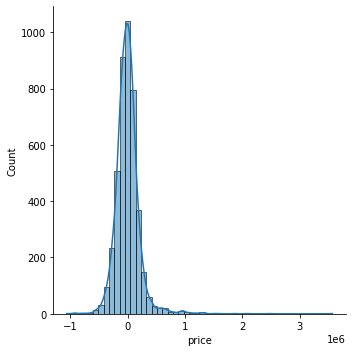

In [59]:
#Residual Plot distribution
sns.displot((y_test-y_pred), bins = 50, kde = True)
plt.show()

- Residual plot shows that the distribution of residuals is normal which indicates that they are due to random chance which is good for any model especially those based on assumptions of normality like Multiple Linear Regression.

#### Assessing Heteroskedasticity using Barlett's test

In [60]:
#Installing module to perform Barlett's test on Dataset
!pip install pingouin

In [62]:
#Performing Barlett's test
import pingouin as pg
pg.homoscedasticity(house2, method="bartlett", alpha=.05)


TypeError: ignored

>The above test of Homoscedasticity returns ‘T’ for Bartlett's test, 'pval': p-value and 'equal_var': True if data has equal variance. From the above results we can see that pval is significant meaning that we reject Null hypothesis (the data has equal variance). Thus there's sufficient evidence to show that the dataset has Heteroskedasticity thereby violating an assumption that MLR is based on. This means using MLR is not best for this data.

#### MLR Coefficients

In [63]:
# Below are the coefficients of this first model. We use a for loop to go through 
# the model and the zip function to combine the two columns.
# 
coef_dict_baseline = {}
for coef, feat in zip(regressor.coef_,X.columns):
    coef_dict_baseline[feat] = coef
coef_dict_baseline

{'bathrooms': 102514.11562334921,
 'bedrooms': -4529.311221191997,
 'condition': 11756.210640039024,
 'floors': 45879.55466297516,
 'grade': 184448.4960808598,
 'last_renovation': -2095.4158499281098,
 'sqft_basement': 83.08691306767469,
 'sqft_lot': 0.13444552557484712,
 'sqft_lot15': -0.19501191649760585,
 'view': 51392.387071529665,
 'waterfront': 629184.8870783019,
 'yr_built': -4171.453132642794,
 'yr_renovated': 63.71419081537772,
 'zipcode': -214.3558839964934}

In [64]:
#creating df of coefficients
features = X.columns
feat_coef = pd.DataFrame(regressor.coef_, columns=['Coefficients'], index=features)
feat_coef

,Coefficients
bedrooms,-4529.311221
bathrooms,102514.115623
sqft_lot,0.134446
floors,45879.554663
waterfront,629184.887078
view,51392.387072
condition,11756.210640
grade,184448.496081
sqft_basement,83.086913
yr_built,-4171.453133


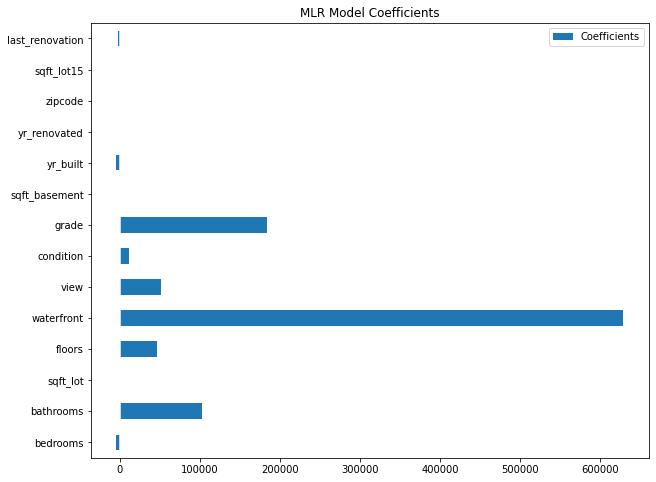

In [65]:
#Displaying coefs
feat_coef.plot(kind='barh', figsize=(10, 8))
plt.title('MLR Model Coefficients')
plt.axvline(x=0, color='1')
plt.show()
# From the above we can see that empmed, median duration of unemployment, in weeks and
# psavert, personal savings rate are the highest contributors to unemployement.

- The major factors positively affecting price according to MLR are grade of the house which shows that a unit increase in house grade results in approximately 113,000USD (assuming price is in USD) increase in price of house followed by number of bathrooms which shows that a unit increase in number of bathrooms in a house (holding other features constant) results in an increase in house price of approximately 5,400USD. Conversely year built negatively affects the price that is a unit increase in year built(age of the house) results in a drop in price by about 2,400USD.

### 7.2 Quantile Regression

In [66]:
#features and label
X = house.drop('price', axis=1)
y = house['price']

#splitting dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [67]:
#feature scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [68]:
#Create a X_train dataframe
df_x = pd.DataFrame(data=X_train, columns= X.columns )

#y_train into df and combine
ys = pd.Series(y_train, name="Price")
ys_df = ys.to_frame()
ys_df = ys_df.reset_index()
ys_df.drop('index', axis=1, inplace=True)
ys_df.head()

#Combining the X_train and y_train to create a Train Dataframe
df_trn = pd.concat([df_x,ys_df], axis=1)
df_trn.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,last_renovation,Price
0,-0.390034,-1.448137,-0.553950,-0.230237,-0.917940,-0.090676,-0.308729,0.912568,-0.561066,-0.863480,0.466354,-1.050183,-0.213973,0.692746,-0.316910,-0.232458,-0.195702,495000.0
1,-0.390034,0.494296,-0.326485,-0.100354,-0.917940,-0.090676,-0.308729,0.912568,0.288989,-0.695184,0.624148,0.306459,-0.213973,-1.344480,0.469992,-0.112888,-0.195702,635000.0
2,-0.390034,-0.800659,-1.073871,-0.127277,-0.917940,-0.090676,-0.308729,-0.625578,0.288989,-0.839438,-0.660743,0.543871,-0.213973,-0.073550,-0.404344,-0.107053,-0.195702,382500.0
3,0.670294,0.494296,0.139277,-0.193117,0.925082,-0.090676,-0.308729,-0.625578,0.288989,0.506933,-0.660743,0.747367,-0.213973,-0.877227,-0.025465,-0.210129,-0.195702,382500.0
4,-0.390034,0.494296,-0.304822,-0.247909,0.925082,-0.090676,-0.308729,-0.625578,-0.561066,-0.659120,0.601606,0.476039,-0.213973,0.767507,-0.287766,-0.290694,-0.195702,670000.0


#### 0.5 Quantile Regression

In [69]:
#Getting summary report of dataset at 0.5 Quantile
mod = smf.quantreg('Price ~ view + condition + grade + sqft_above + sqft_basement + yr_built + yr_renovated + zipcode + sqft_living15 + sqft_lot15 + last_renovation', df_trn)
res = mod.fit(q=.5)
print(res.summary())

                         QuantReg Regression Results                          
Dep. Variable:                  Price   Pseudo R-squared:               0.3797
Model:                       QuantReg   Bandwidth:                   2.703e+04
Method:                 Least Squares   Sparsity:                    3.432e+05
Date:                Thu, 17 Feb 2022   No. Observations:                17290
Time:                        01:22:32   Df Residuals:                    17278
                                        Df Model:                           11
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept        5.174e+05   1305.165    396.393      0.000    5.15e+05     5.2e+05
view             3.949e+04   1434.555     27.526      0.000    3.67e+04    4.23e+04
condition        1.308e+04   1459.978      8.960      0.000    1.02e+04    1.59e+04
grade            1.403e+05 

In [70]:
#Creating test dataframe
df_xt = pd.DataFrame(data=X_test, columns= X.columns )

#y_train into df and combine
yst = pd.Series(y_test, name="Price")
yst_df = yst.to_frame()
yst_df = yst_df.reset_index()
yst_df.drop('index', axis=1, inplace=True)
yst_df

df_test = pd.concat([df_xt,yst_df], axis=1)
df_test.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,last_renovation,Price
0,-1.450362,-0.800659,-0.705594,-0.321556,2.768105,-0.090676,-0.308729,-0.625578,-0.561066,-0.430718,-0.660743,0.950863,-0.213973,0.879648,-0.812367,-0.402809,-0.195702,297000.0
1,0.670294,1.465513,2.803870,0.865742,0.925082,-0.090676,-0.308729,0.912568,3.689210,3.464142,-0.660743,0.577787,-0.213973,-1.363171,3.267865,1.017086,-0.195702,1580000.0
2,-1.450362,-1.771876,-0.694762,-0.273058,-0.917940,-0.090676,-0.308729,-0.625578,-0.561066,-0.707205,-0.119736,-1.932000,-0.213973,0.543225,-0.797795,-0.307369,-0.195702,562100.0
3,-1.450362,-1.448137,-1.030544,-0.298135,-0.917940,-0.090676,-0.308729,0.912568,0.288989,-0.791353,-0.660743,-1.491091,-0.213973,0.580605,-0.448061,-0.346986,-0.195702,631500.0
4,0.670294,0.494296,1.189950,-0.133405,0.925082,-0.090676,2.285017,-0.625578,1.139045,1.672987,-0.660743,1.052611,-0.213973,1.440353,0.659431,0.087392,-0.195702,780000.0


In [71]:
#Predicting

pred = res.predict(df_test)
pred

0       2.813778e+05
1       1.300354e+06
2       4.730935e+05
3       5.630826e+05
4       8.236107e+05
            ...     
4318    8.556179e+05
4319    3.199845e+05
4320    2.703189e+05
4321    2.572485e+05
4322    3.535258e+05
Length: 4323, dtype: float64

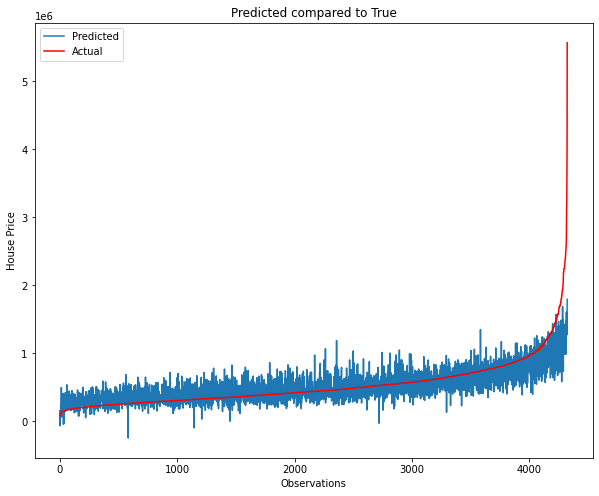

In [72]:
# Observations sorted by y_test values
# higher indices means higher HousePrice
d_obs = pd.DataFrame({'y_test':df_test['Price'],'y_pred': pred})
d_obs.sort_values(by=['y_test'],inplace=True)

# Plot the y_test and the prediction (pred)
fig = plt.figure(figsize=(10, 8))
plt.plot(np.arange(0,len(d_obs),1), d_obs['y_pred'], markersize=10, label='Predicted')
plt.plot(np.arange(0,len(d_obs),1), d_obs['y_test'],'r-',markersize=10, label='Actual', alpha=1)
plt.ylabel('House Price')
plt.xlabel('Observations')
plt.title('Predicted compared to True')
plt.legend(loc='upper left')
plt.show()

- The predictions can be seen to vary across (blue line spikes) the dataset. This is not a good thing for out models, shows instability.

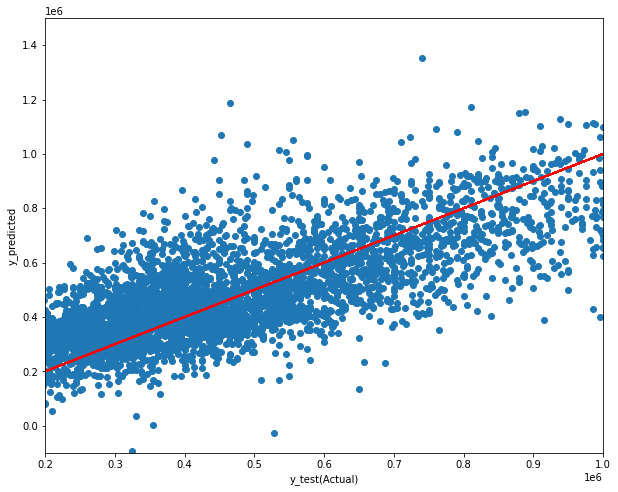

In [73]:
#Residuals
fig = plt.figure(figsize=(10, 8))
plt.scatter(y_test, pred)
plt.ylim(-100000, 1500000)
plt.xlim(200000, 1000000)
plt.plot(y_test, y_test, "r")
plt.xlabel('y_test(Actual)')
plt.ylabel('y_predicted');

#See how the relative residuals are distributed across testing sample

- As can be noted above as the predicted gets into the higher house price values it is widely distributed(higher variance).

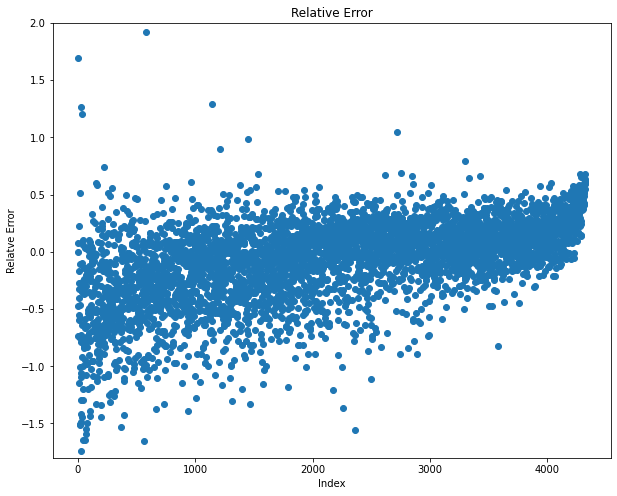

In [74]:
#Relative Error Plot
# Relatve Error = (y_test - predicted)/y_test
fig = plt.figure(figsize=(10, 8))
plt.scatter(np.arange(0,len(d_obs),1), (d_obs['y_test'] - d_obs['y_pred'])/d_obs['y_test'] )
plt.ylim(-1.8,2.0)
plt.ylabel('Relatve Error')
plt.xlabel('Index')
plt.title('Relative Error');
#Observations were sorted by y_test values meaning higher indices mean higher House Price

It can be noted that at the lower indices the variance is high. In an even variance dataset the plot will appear tight like a horizontal line but this pyramid shape tells us that there's heteroskedasticity in the data.

In [75]:
# Showing the RMSE, MSE & R-squared
print('Accuracy on Testing Sample:')
print('MSE       = %f' % (mean_squared_error(y_test, pred)))
print('RMSE      = %f' % (np.sqrt(mean_squared_error(y_test, pred))))
print('R-Squared = %f' % (r2_score(y_test, pred)))

Accuracy on Testing Sample:
MSE       = 46719188142.390717
RMSE      = 216146.219357
R-Squared = 0.607682


The R-squared is about 60.8% which is better than MLR at 59% meaning the median quantile regression produces a more accurate model compared to MLR. A possible reason for the better performance of Median is that it is more robust to outliers than the mean which is used in MLR.

#### 0.25 Quantile Regression

In [76]:
#Getting summary report of dataset at 0.25 Quantile
mod = smf.quantreg('Price ~ view + condition + grade + sqft_above + sqft_basement + yr_built + yr_renovated + zipcode + sqft_living15 + sqft_lot15 + last_renovation', df_trn)
res = mod.fit(q=.25)
print(res.summary())

                         QuantReg Regression Results                          
Dep. Variable:                  Price   Pseudo R-squared:               0.3069
Model:                       QuantReg   Bandwidth:                   2.350e+04
Method:                 Least Squares   Sparsity:                    3.989e+05
Date:                Thu, 17 Feb 2022   No. Observations:                17290
Time:                        01:26:14   Df Residuals:                    17278
                                        Df Model:                           11
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept        4.154e+05   1313.945    316.182      0.000    4.13e+05    4.18e+05
view             2.411e+04   1443.231     16.706      0.000    2.13e+04    2.69e+04
condition        1.119e+04   1476.791      7.578      0.000    8296.860    1.41e+04
grade            1.152e+05 

In [77]:
#Creating test dataframe
df_xt = pd.DataFrame(data=X_test, columns= X.columns )

#y_train into df and combine
yst = pd.Series(y_test, name="Price")
yst_df = yst.to_frame()
yst_df = yst_df.reset_index()
yst_df.drop('index', axis=1, inplace=True)
yst_df

df_test = pd.concat([df_xt,yst_df], axis=1)
df_test.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,last_renovation,Price
0,-1.450362,-0.800659,-0.705594,-0.321556,2.768105,-0.090676,-0.308729,-0.625578,-0.561066,-0.430718,-0.660743,0.950863,-0.213973,0.879648,-0.812367,-0.402809,-0.195702,297000.0
1,0.670294,1.465513,2.803870,0.865742,0.925082,-0.090676,-0.308729,0.912568,3.689210,3.464142,-0.660743,0.577787,-0.213973,-1.363171,3.267865,1.017086,-0.195702,1580000.0
2,-1.450362,-1.771876,-0.694762,-0.273058,-0.917940,-0.090676,-0.308729,-0.625578,-0.561066,-0.707205,-0.119736,-1.932000,-0.213973,0.543225,-0.797795,-0.307369,-0.195702,562100.0
3,-1.450362,-1.448137,-1.030544,-0.298135,-0.917940,-0.090676,-0.308729,0.912568,0.288989,-0.791353,-0.660743,-1.491091,-0.213973,0.580605,-0.448061,-0.346986,-0.195702,631500.0
4,0.670294,0.494296,1.189950,-0.133405,0.925082,-0.090676,2.285017,-0.625578,1.139045,1.672987,-0.660743,1.052611,-0.213973,1.440353,0.659431,0.087392,-0.195702,780000.0


In [78]:
#Predicting

pred = res.predict(df_test)
pred

0       2.241534e+05
1       1.099356e+06
2       3.703934e+05
3       4.522422e+05
4       6.715869e+05
            ...     
4318    7.245717e+05
4319    2.479964e+05
4320    1.990081e+05
4321    1.900092e+05
4322    2.664469e+05
Length: 4323, dtype: float64

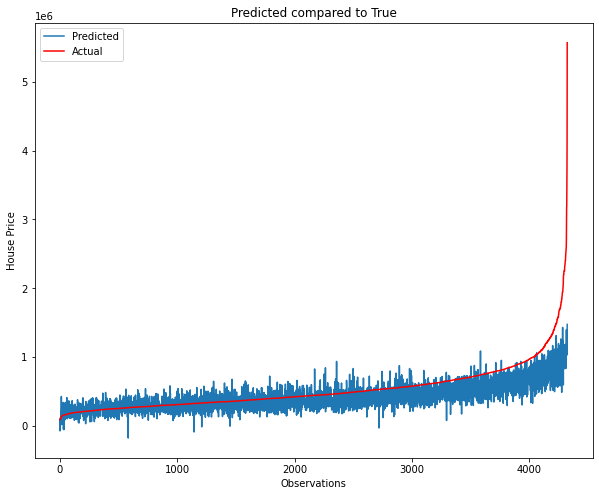

In [79]:
# Observations sorted by y_test values
# higher indices means higher HousePrice
d_obs = pd.DataFrame({'y_test':df_test['Price'],'y_pred': pred})
d_obs.sort_values(by=['y_test'],inplace=True)

# Plot the y_test and the prediction (pred)
fig = plt.figure(figsize=(10, 8))
plt.plot(np.arange(0,len(d_obs),1), d_obs['y_pred'], markersize=10, label='Predicted')
plt.plot(np.arange(0,len(d_obs),1), d_obs['y_test'],'r-',markersize=10, label='Actual', alpha=1)
plt.ylabel('House Price')
plt.xlabel('Observations')
plt.title('Predicted compared to True')
plt.legend(loc='upper left')
plt.show()

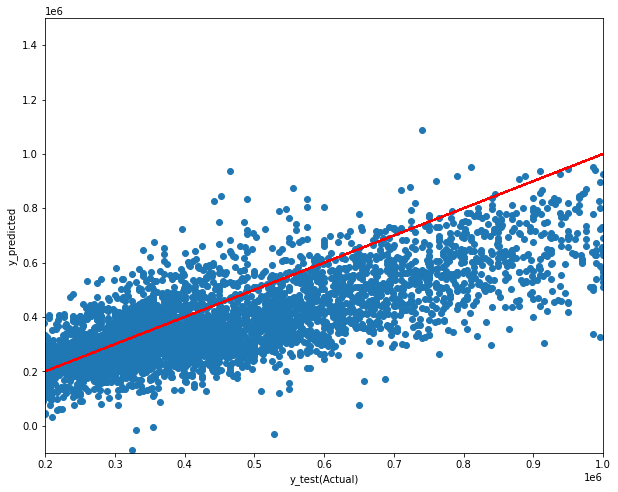

In [80]:
#Residuals
fig = plt.figure(figsize=(10, 8))
plt.scatter(y_test, pred)
plt.ylim(-100000, 1500000)
plt.xlim(200000, 1000000)
plt.plot(y_test, y_test, "r")
plt.xlabel('y_test(Actual)')
plt.ylabel('y_predicted');

#See how the relative residuals are distributed across testing sample

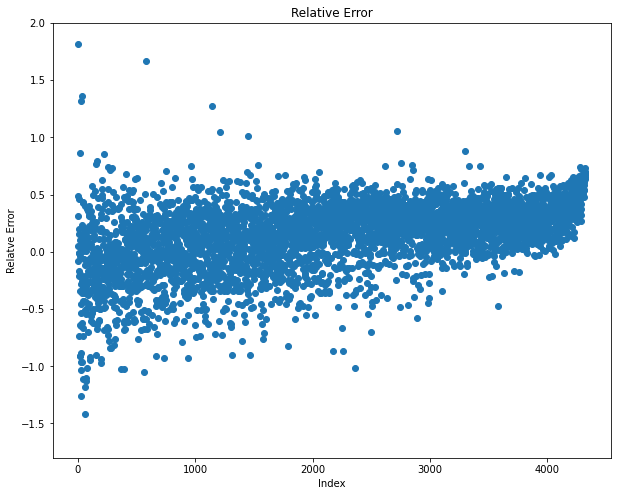

In [81]:
#Relative Error Plot
# Relatve Error = (y_test - predicted)/y_test
fig = plt.figure(figsize=(10, 8))
plt.scatter(np.arange(0,len(d_obs),1), (d_obs['y_test'] - d_obs['y_pred'])/d_obs['y_test'] )
plt.ylim(-1.8,2.0)
plt.ylabel('Relatve Error')
plt.xlabel('Index')
plt.title('Relative Error');
#Observations were sorted by y_test values meaning higher indices mean higher House Price

In [82]:
# Showing the RMSE, MSE & R-squared
print('Accuracy on Testing Sample:')
print('MSE       = %f' % (mean_squared_error(y_test, pred)))
print('RMSE      = %f' % (np.sqrt(mean_squared_error(y_test, pred))))
print('R-Squared = %f' % (r2_score(y_test, pred)))

Accuracy on Testing Sample:
MSE       = 65275298766.616844
RMSE      = 255490.310514
R-Squared = 0.451859


The R-squared is about 45.1% which is the worst so far. The median still remains the better one.

#### 0.75 Quantile Regression

In [83]:
#Getting summary report of dataset at 0.25 Quantile
mod = smf.quantreg('Price ~ view + condition + grade + sqft_above + sqft_basement + yr_built + yr_renovated + zipcode + sqft_living15 + sqft_lot15 + last_renovation', df_trn)
res = mod.fit(q=.75)
print(res.summary())

                         QuantReg Regression Results                          
Dep. Variable:                  Price   Pseudo R-squared:               0.4416
Model:                       QuantReg   Bandwidth:                   2.502e+04
Method:                 Least Squares   Sparsity:                    4.795e+05
Date:                Thu, 17 Feb 2022   No. Observations:                17290
Time:                        01:27:15   Df Residuals:                    17278
                                        Df Model:                           11
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          6.3e+05   1579.206    398.956      0.000    6.27e+05    6.33e+05
view             6.347e+04   1750.899     36.248      0.000       6e+04    6.69e+04
condition        1.149e+04   1772.756      6.481      0.000    8013.912     1.5e+04
grade            1.532e+05 

In [84]:
#Creating test dataframe
df_xt = pd.DataFrame(data=X_test, columns= X.columns )

#y_train into df and combine
yst = pd.Series(y_test, name="Price")
yst_df = yst.to_frame()
yst_df = yst_df.reset_index()
yst_df.drop('index', axis=1, inplace=True)
yst_df

df_test = pd.concat([df_xt,yst_df], axis=1)
df_test.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,last_renovation,Price
0,-1.450362,-0.800659,-0.705594,-0.321556,2.768105,-0.090676,-0.308729,-0.625578,-0.561066,-0.430718,-0.660743,0.950863,-0.213973,0.879648,-0.812367,-0.402809,-0.195702,297000.0
1,0.670294,1.465513,2.803870,0.865742,0.925082,-0.090676,-0.308729,0.912568,3.689210,3.464142,-0.660743,0.577787,-0.213973,-1.363171,3.267865,1.017086,-0.195702,1580000.0
2,-1.450362,-1.771876,-0.694762,-0.273058,-0.917940,-0.090676,-0.308729,-0.625578,-0.561066,-0.707205,-0.119736,-1.932000,-0.213973,0.543225,-0.797795,-0.307369,-0.195702,562100.0
3,-1.450362,-1.448137,-1.030544,-0.298135,-0.917940,-0.090676,-0.308729,0.912568,0.288989,-0.791353,-0.660743,-1.491091,-0.213973,0.580605,-0.448061,-0.346986,-0.195702,631500.0
4,0.670294,0.494296,1.189950,-0.133405,0.925082,-0.090676,2.285017,-0.625578,1.139045,1.672987,-0.660743,1.052611,-0.213973,1.440353,0.659431,0.087392,-0.195702,780000.0


In [85]:
#Predicting

pred = res.predict(df_test)
pred

0       3.511312e+05
1       1.526352e+06
2       5.751134e+05
3       6.563396e+05
4       1.039539e+06
            ...     
4318    1.009500e+06
4319    3.839463e+05
4320    3.381813e+05
4321    3.257136e+05
4322    4.332392e+05
Length: 4323, dtype: float64

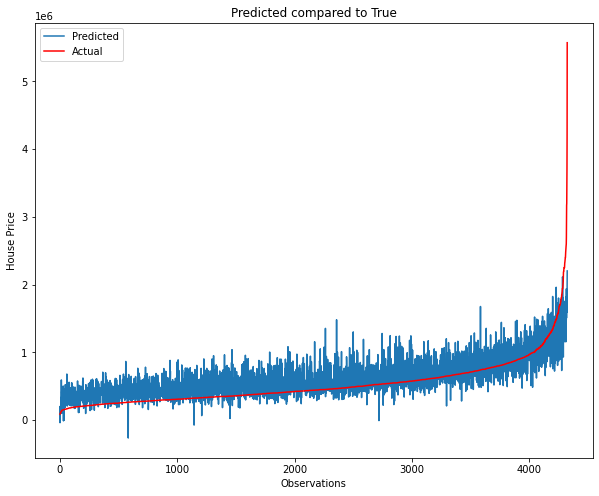

In [86]:
# Observations sorted by y_test values
# higher indices means higher HousePrice
d_obs = pd.DataFrame({'y_test':df_test['Price'],'y_pred': pred})
d_obs.sort_values(by=['y_test'],inplace=True)

# Plot the y_test and the prediction (pred)
fig = plt.figure(figsize=(10, 8))
plt.plot(np.arange(0,len(d_obs),1), d_obs['y_pred'], markersize=10, label='Predicted')
plt.plot(np.arange(0,len(d_obs),1), d_obs['y_test'],'r-',markersize=10, label='Actual', alpha=1)
plt.ylabel('House Price')
plt.xlabel('Observations')
plt.title('Predicted compared to True')
plt.legend(loc='upper left')
plt.show()

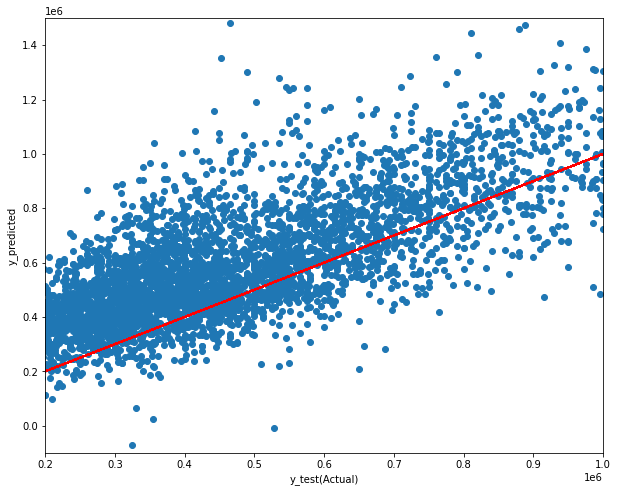

In [87]:
#Residuals
fig = plt.figure(figsize=(10, 8))
plt.scatter(y_test, pred)
plt.ylim(-100000, 1500000)
plt.xlim(200000, 1000000)
plt.plot(y_test, y_test, "r")
plt.xlabel('y_test(Actual)')
plt.ylabel('y_predicted');

#See how the relative residuals are distributed across testing sample

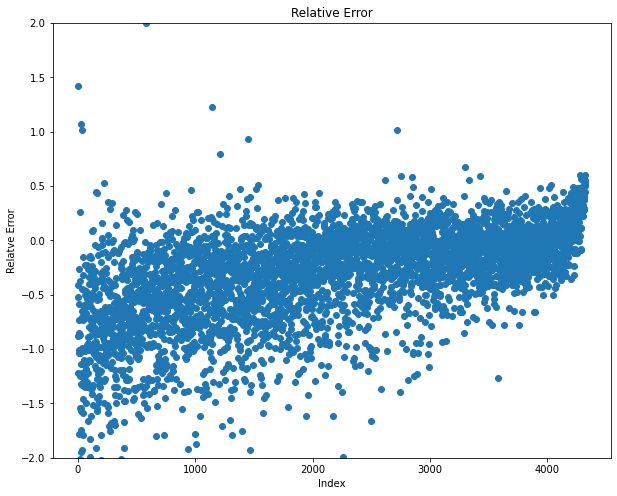

In [88]:
#Relative Error Plot
# Relatve Error = (y_test - predicted)/y_test
fig = plt.figure(figsize=(10, 8))
plt.scatter(np.arange(0,len(d_obs),1), (d_obs['y_test'] - d_obs['y_pred'])/d_obs['y_test'] )
plt.ylim(-2.0,2.0)
plt.ylabel('Relatve Error')
plt.xlabel('Index')
plt.title('Relative Error');
#Observations were sorted by y_test values meaning higher indices mean higher House Price

In [89]:
# Showing the RMSE, MSE & R-squared
print('Accuracy on Testing Sample:')
print('MSE       = %f' % (mean_squared_error(y_test, pred)))
print('RMSE       = %f' % (np.sqrt(mean_squared_error(y_test, pred))))
print('R-Squared   = %f' % (r2_score(y_test, pred)))

Accuracy on Testing Sample:
MSE       = 53709867637.599991
RMSE       = 231753.894547
R-Squared   = 0.548978


The R-squared is about 54.89% which is the worst so far. The median quantile regression still remains the better one with a R-squared of about 60.8%

### 7.3 Ridge Regression

In [90]:
# Data Preparation

# Setting up our X and y datasets
#Since Ridge Regression is not affected by multicollinearity we use the dataset that has collineated features
X = house.drop('price', axis=1)
y = house['price']

In [91]:
#split dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [92]:
#feature scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [93]:
#ridge
#
ridge = Ridge(normalize=True)
search = GridSearchCV(estimator=ridge,param_grid={'alpha':np.logspace(-5,2,8)},scoring='neg_mean_squared_error',n_jobs=1,refit=True,cv=10)

In [94]:
# We now use the .fit function to run the model and then use the .best_params_ and
#  .best_scores_ function to determine the models strength. 
# 
search.fit(X_train,y_train)
print(search.best_params_)
abs(search.best_score_) 

{'alpha': 0.001}


48302186272.434654

In [96]:
# We can confirm this by fitting our model with the ridge information and finding the mean squared error below
#
ridge = Ridge(normalize=True,alpha=0.0001)
ridge.fit(X_train,y_train)
second_model = (mean_squared_error(y_true=y_test,y_pred=ridge.predict(X_test)))
sec_model = (np.sqrt(mean_squared_error(y_true=y_test,y_pred=ridge.predict(X_test))))
rsecond_model = (r2_score(y_true=y_test,y_pred=ridge.predict(X_test)))
print("MSE:       ", second_model)
print("RMSE:      ", sec_model)
print("R-squared: ", rsecond_model)

MSE:        42207736136.63114
RMSE:       205445.2144408118
R-squared:  0.6455660620851507


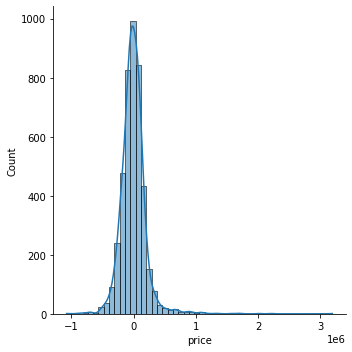

In [97]:
#Residual Plot distribution
y_pred=ridge.predict(X_test)
sns.displot((y_test-y_pred), bins = 50, kde = True)
plt.show()

In [98]:
# The 0.645 is better than the 0.596 which indicates that Ridge regression is better suited than MLR. 
# The coefficients show different weightings
# 
coef_dict_baseline = {}
for coef, feat in zip(ridge.coef_,X.columns):
    coef_dict_baseline[feat] = coef
coef_dict_baseline


{'bathrooms': 34624.63033598971,
 'bedrooms': -35647.66879936771,
 'condition': 12344.624089444396,
 'floors': 15914.735222801206,
 'grade': 138865.67265263465,
 'last_renovation': -12439.219228270726,
 'sqft_above': 66144.77351765995,
 'sqft_basement': 38025.61504955513,
 'sqft_living': 77871.53113224999,
 'sqft_living15': 18315.848531599415,
 'sqft_lot': 1115.1181478945418,
 'sqft_lot15': -16838.697993612215,
 'view': 33207.096764152164,
 'waterfront': 53830.834107391325,
 'yr_built': -106205.45686472522,
 'yr_renovated': 15263.601200352246,
 'zipcode': 1537.7298122118866}

In [99]:
#creating df of coefficients
features = X.columns
feat_coef = pd.DataFrame(ridge.coef_, columns=['Coefficients'], index=features)
feat_coef

,Coefficients
bedrooms,-35647.668799
bathrooms,34624.630336
sqft_living,77871.531132
sqft_lot,1115.118148
floors,15914.735223
waterfront,53830.834107
view,33207.096764
condition,12344.624089
grade,138865.672653
sqft_above,66144.773518


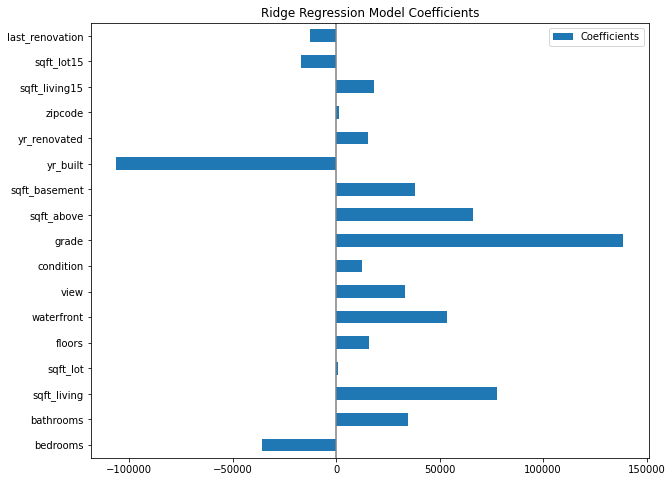

In [100]:
#Displaying coefs
feat_coef.plot(kind='barh', figsize=(10, 8))
plt.title('Ridge Regression Model Coefficients')
plt.axvline(x=0, color='.5')
plt.show()

> Ridge model proved to provide a better model than MLR (63% R-squared compared to approx 60%) and Median Quantile Regression(which was the best among 0.25,0.5 & 0.75 Quantiles and it had an R-squared of 61.6%). The RMSE dropped by about 1% in Ridge compared to MLR (RMSE compared to mean price).

>It is interesting that the coefficients weights changed compared to MLR this is because of the L2 regularization that it imposes on the model. Since Ridge regression can handle multicollinearity we see that sqft_living has a major influence on house prices which makes sense though we had to drop it in MLR due to it's high VIF score. Similarly age of the house (year built) has a marked influence on price than reflected in MLR. Still the top feature is grade same as in MLR.

### 7.4 Lasso Regression

In [101]:
# Features and label
X = house.drop('price', axis=1)
y = house['price']

In [102]:
#split dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [103]:
#feature scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [104]:
#setting parameter space
parameters = {'alpha': np.concatenate((np.arange(0.1,2,0.1), np.arange(2, 5, 0.5), np.arange(5, 25, 1)))}

#lasso regression
lasso = Lasso() 
gridlasso = GridSearchCV(lasso, parameters, scoring ='r2') 

# Fitting models and print the best parameters, R-squared scores, MSE, and coefficients
gridlasso.fit(X_train, y_train) 
print("lasso best parameters:", gridlasso.best_params_) 
print("lasso score:", gridlasso.score(X_test, y_test))
print("lasso MSE:", mean_squared_error(y_test, gridlasso.predict(X_test)))
print("lasso RMSE:", np.sqrt(mean_squared_error(y_test, gridlasso.predict(X_test))))
print("lasso R-squared:", r2_score(y_test, gridlasso.predict(X_test)))
print("lasso best estimator coef:", gridlasso.best_estimator_.coef_)

lasso best parameters: {'alpha': 24.0}
lasso score: 0.645571754830103
lasso MSE: 42207058216.57006
lasso RMSE: 205443.56455379678
lasso R-squared: 0.645571754830103
lasso best estimator coef: [ -35632.8    34452.58  220949.38    1036.7    15902.13   53822.9
   33215.16   12317.73  138935.18  -62587.18  -30615.83 -106156.78
   14989.85    1502.01   18153.3   -16766.54  -12158.03]


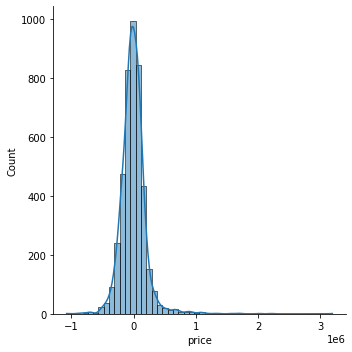

In [105]:
#Residual Plot distribution
y_pred = gridlasso.predict(X_test)
sns.displot((y_test-y_pred), bins = 50, kde = True)
plt.show()

In [106]:
# The 0.4516 is marginally lower than the 0.452 which indicate that there is little difference between the lasso, ridge and MLR models. 
# The coefficients show different weightings
# 
coef_dict_baseline = {}
for coef, feat in zip(gridlasso.best_estimator_.coef_,X.columns):
    coef_dict_baseline[feat] = coef
coef_dict_baseline


{'bathrooms': 34452.58007712644,
 'bedrooms': -35632.80362333145,
 'condition': 12317.730393117588,
 'floors': 15902.12591868166,
 'grade': 138935.1760243009,
 'last_renovation': -12158.034857374694,
 'sqft_above': -62587.18424669845,
 'sqft_basement': -30615.833412091117,
 'sqft_living': 220949.3831625602,
 'sqft_living15': 18153.298885223656,
 'sqft_lot': 1036.7042803797556,
 'sqft_lot15': -16766.539973861843,
 'view': 33215.161285307186,
 'waterfront': 53822.90444686527,
 'yr_built': -106156.77566151513,
 'yr_renovated': 14989.848952202192,
 'zipcode': 1502.0105513874566}

In [107]:
#creating df of coefficients
features = X.columns
feat_coef = pd.DataFrame(gridlasso.best_estimator_.coef_, columns=['Coefficients'], index=features)
feat_coef

,Coefficients
bedrooms,-35632.803623
bathrooms,34452.580077
sqft_living,220949.383163
sqft_lot,1036.704280
floors,15902.125919
waterfront,53822.904447
view,33215.161285
condition,12317.730393
grade,138935.176024
sqft_above,-62587.184247


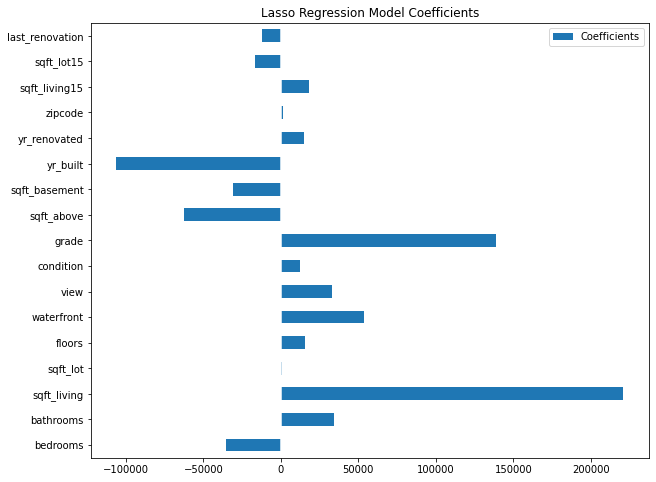

In [108]:
#Displaying coefs
feat_coef.plot(kind='barh', figsize=(10, 8))
plt.title('Lasso Regression Model Coefficients')
plt.axvline(x=0, color='1')
plt.show()

- Lasso model proved to provide an almost similar model to Ridge. However it gave a model with a slightly higher MSE than Ridge though the R-squared was almost the same with Ridge. L1 regularization is the one used for lasso regression. But here we can note none of the features were reduced to zero and thus dropped. This means all the features are important in predicting house price. In this case it would be better to use Ridge since there's no danger of feature selection especially with a dataset that has a low number of features such as this one. Additionally Ridge handles multicollinear variables and won't reduce them like Lasso.

### 7.5 Elastic Net Regression

In [109]:
# Features and label
X = house.drop('price', axis=1)
y = house['price']

In [110]:
#split dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)

In [111]:
#feature scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [114]:
# Elastic Net Model
 
elastic=ElasticNet(normalize=True)
search=GridSearchCV(estimator=elastic,param_grid={'alpha':np.logspace(-5,2,8),'l1_ratio':[.2,.4,.6,.8]},scoring='neg_mean_squared_error',n_jobs=1,refit=True,cv=10)

In [115]:
# We will now fit our model and display the best parameters and the best results we can get with that setup.
# 
search.fit(X,y)
print(search.best_params_)
abs(search.best_score_)

{'alpha': 1e-05, 'l1_ratio': 0.8}


47432075157.86842

In [116]:
# The best hyperparameters was an alpha set to 0.00001 and a l1_ratio of 0.8. 
elastic=ElasticNet(normalize=True,alpha=0.00001,l1_ratio=0.8)

elastic.fit(X_train,y_train)
third_model=(mean_squared_error(y_true=y_test,y_pred=elastic.predict(X_test)))
th_m = np.sqrt(mean_squared_error(y_true=y_test,y_pred=elastic.predict(X_test)))
third_m = r2_score(y_true=y_test,y_pred=elastic.predict(X_test))
print("MSE:       ", third_model)
print("RMSE:      ", th_m)
print("R-squared: ", third_m)


# With these settings we got an R-square of only 45% . 
# Which means that elastic net is doing worse than linear, lasso and ridge regression. 

MSE:        49256471317.685776
RMSE:       221937.98980275047
R-squared:  0.6416696568289155


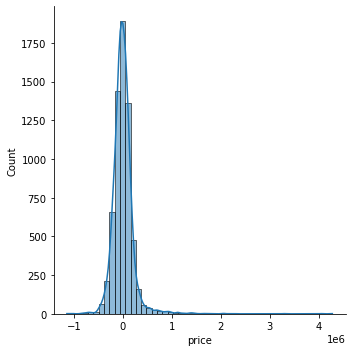

In [117]:
#Residual Plot distribution
y_pred=elastic.predict(X_test)
sns.displot((y_test-y_pred), bins = 50, kde = True)
plt.show()

In [118]:
# Below are the coefficients
# 
coef_dict_baseline = {}
for coef, feat in zip(elastic.coef_,X.columns):
    coef_dict_baseline[feat] = coef
coef_dict_baseline

# The coefficients are mostly the same. 
# Notice that view has been greatly minimized in the elastic net version. 
# This means that this values was not as important to the algorithm.

{'bathrooms': 30963.640018658967,
 'bedrooms': -29445.183051867898,
 'condition': 14177.95724067073,
 'floors': 17266.629463425987,
 'grade': 131477.6455986954,
 'last_renovation': -5105.069266040442,
 'sqft_above': 59382.24260284015,
 'sqft_basement': 37828.39028637018,
 'sqft_living': 71636.01674299678,
 'sqft_living15': 26434.420971136093,
 'sqft_lot': 3618.665813066708,
 'sqft_lot15': -15553.919681784764,
 'view': 34646.265988669125,
 'waterfront': 51186.73027207832,
 'yr_built': -95989.39687817877,
 'yr_renovated': 8752.867909442668,
 'zipcode': 5105.466496145916}

In [119]:
#creating df of coefficients
features = X.columns
feat_coef = pd.DataFrame(elastic.coef_, columns=['Coefficients'], index=features)
feat_coef

,Coefficients
bedrooms,-29445.183052
bathrooms,30963.640019
sqft_living,71636.016743
sqft_lot,3618.665813
floors,17266.629463
waterfront,51186.730272
view,34646.265989
condition,14177.957241
grade,131477.645599
sqft_above,59382.242603


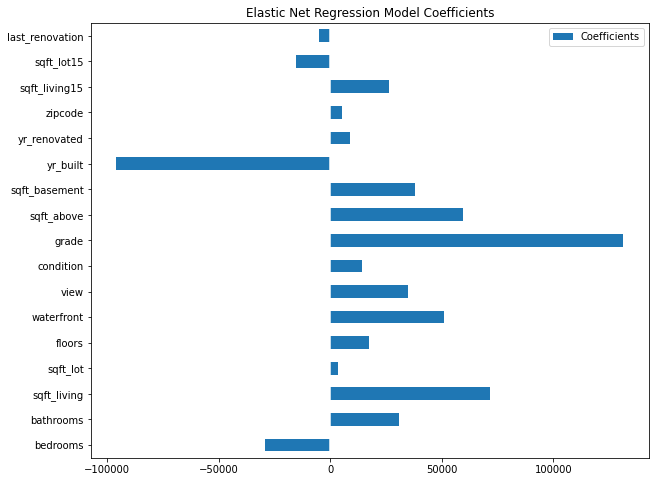

In [120]:
#Displaying coefs
feat_coef.plot(kind='barh', figsize=(10, 8))
plt.title('Elastic Net Regression Model Coefficients')
plt.axvline(x=0, color='1')
plt.show()

- Elastic Net model provided the best model in comparison to Ridge, Lasso, MLR and Quantile Regression(0.25,0.5 & 0.75 quantiles). It had a R-squared of about 63.8%. It is important to note how it used mostly L1 regularization (at 0.8 L1_ratio) to reduce some feature weights like ZipCode which was almost zero but did not remove them (compare Lasso and Elastic Net).This balancing effect is because of the L2 regularization effect. This is where Elastic Net shines through, performing feature selection whilst maintaining any correlated features in the model. In this case though it's R squared was better with a slightly higher MSE which is expected because it utilises both penalty types unlike the other models. In this case Elastic Net Regression offers the best performance and should be used.

## 8 Challenging the Solution


- It is possible to improve the models used above by trying other Regression types such as Polynomial Regression. Additionally we've not used location information (a cross feature of latitude and longitude) that could possibly allow the models used to learn about correlations in housing blocks as compared to ZipCodes which are too expansive. This may produce higher R-squared values and hence better model performance.

## 9 Follow up questions

### 9.1 Did we have the right data?


- It may be possible to answer this question conclusively once we've included the latitude and longitude and observed the model/evaluated it. But with all other features except the 2 features we get models that explain about 60% of the variance in the data with the best performance coming from Elastic Net Regression model at about 63.7%. So we can say we have some of the right data.

### 9.2 Do we need other data to answer our question?

- In line with the issue of right data, it is recommended that indeed we should increase the number of explanatory variables/features that explain the house prices thus enabling us to get better prediction models.



### 9.3 Did we have the right question?

- Given the dataset and the business objective, the right question was asked and explored. The only hindrance to achieving success in this case is we didn't have enough features(data explaining house prices).